# Step 1: Install Dependencies

In [1]:
!pip install -U --pre triton
!pip install -U xformers
!pip install accelerate transformers datasets
!pip install bitsandbytes
!pip install diffusers
!pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
!pip install peft
!pip install tensorboard
!pip install safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.4/209.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 98.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.1/797.1 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 36.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Step 2: Update Diffusers

In [2]:
!pip uninstall -y diffusers
!pip install git+https://github.com/huggingface/diffusers.git

Found existing installation: diffusers 0.30.2
Uninstalling diffusers-0.30.2:
  Successfully uninstalled diffusers-0.30.2
  Cloning https://github.com/huggingface/diffusers.git to /tmp/pip-req-build-wzxqzlub
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/diffusers.git /tmp/pip-req-build-wzxqzlub
  Resolved https://github.com/huggingface/diffusers.git to commit 8336405e50e204fad3601e8350e04e6daa838eb4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.31.0.dev0-py3-none-any.whl size=2750090 sha256=777f8286aa73648963012ed8fbe05c6917b7699c2ab6dc8d7e2726b3794e9c14
  Stored in directory: /tmp/pip-ephem-wheel-cache-n17nzuut/wheels/4d/b7/a8/6f9549ceec5daad78675b857ac57d697c387062506520a7b50
Successfully built diffusers


# Step 3: Upgrade Transformers and Accelerate

In [3]:
!pip install --upgrade transformers accelerate

# Step 4: Download Training Script

In [4]:
!wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/text_to_image/train_text_to_image_lora.py

--2024-09-16 10:14:29--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/text_to_image/train_text_to_image_lora.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40697 (40K) [text/plain]
Saving to: ‘train_text_to_image_lora.py’

train_text_to_image 100%[===================>]  39.74K  --.-KB/s    in 0.007s  

2024-09-16 10:14:29 (5.29 MB/s) - ‘train_text_to_image_lora.py’ saved [40697/40697]



# Step 5: Hugging Face Authentication

In [5]:
from huggingface_hub import notebook_login
notebook_login()

# Step 6: Launch Fine-Tuning Process.








In [6]:
!accelerate launch --mixed_precision="no" --num_processes=1 --num_machines=1 --dynamo_backend="no" train_text_to_image_lora.py \
  --pretrained_model_name_or_path="CompVis/stable-diffusion-v1-4" \
  --dataset_name="yashvoladoddi37/kanjienglish" \
  --image_column="image" \
  --caption_column="text" \
  --resolution=512 \
  --random_flip \
  --train_batch_size=1 \
  --num_train_epochs=1 \
  --checkpointing_steps=1000 \
  --learning_rate=1e-04 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --seed=42 \
  --output_dir="kanji-diffusion" \
  --validation_prompt="A kanji meaning Youtube video" \
  --report_to="tensorboard" \
  --logging_dir="logs" \
  --use_8bit_adam

2024-09-16 10:19:23.037362: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-16 10:19:23.306153: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-16 10:19:23.382825: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-16 10:19:23.841059: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-16 10:19:26.036618: W tensorflow/comp

# Step 7: Launch TensorBoard

In [7]:
%load_ext tensorboard
%tensorboard --logdir /content/kanji-diffusion/logs/text2image-fine-tune

<IPython.core.display.Javascript object>

# Step 8: Zip Output Directory

In [8]:
!zip -r /content/kanji-last-checkpoint.zip /content/kanji-diffusion/checkpoint-5000
!zip -r /content/kanji-logs.zip /content/kanji-diffusion/logs

  adding: content/kanji-diffusion/checkpoint-5000/ (stored 0%)
  adding: content/kanji-diffusion/checkpoint-5000/scheduler.bin (deflated 55%)
  adding: content/kanji-diffusion/checkpoint-5000/optimizer.bin (deflated 9%)
  adding: content/kanji-diffusion/checkpoint-5000/model.safetensors (deflated 7%)
  adding: content/kanji-diffusion/checkpoint-5000/random_states_0.pkl (deflated 25%)
  adding: content/kanji-diffusion/checkpoint-5000/pytorch_lora_weights.safetensors (deflated 6%)
  adding: content/kanji-diffusion/logs/ (stored 0%)
  adding: content/kanji-diffusion/logs/text2image-fine-tune/ (stored 0%)
  adding: content/kanji-diffusion/logs/text2image-fine-tune/1726482013.3257859/ (stored 0%)
  adding: content/kanji-diffusion/logs/text2image-fine-tune/1726482013.3257859/events.out.tfevents.1726482013.79e7ac380faa.3195.1 (deflated 52%)
  adding: content/kanji-diffusion/logs/text2image-fine-tune/events.out.tfevents.1726482013.79e7ac380faa.3195.0 (deflated 7%)
  adding: content/kanji-diffu

# Step 9: Save Checkpoint to Drive



In [9]:
from google.colab import drive
drive.mount('/content/drive')
!cp /content/kanji-last-checkpoint.zip /content/drive/MyDrive/

Mounted at /content/drive


# Step 10: Load Stable Diffusion Pipeline

In [10]:
from diffusers import StableDiffusionPipeline
import torch

model_id = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


# Step 11: Load and Apply LoRA Weights

In [11]:
# Load and apply LoRA weights
lora_model_path = "/content/kanji-diffusion/pytorch_lora_weights.safetensors"
pipe.unet.load_attn_procs(lora_model_path)

# Step 12: Generate and Save Images

In [12]:
def create_kanji(prompt, num_images=1):
    artwork = pipe(prompt, num_images_per_prompt=num_images).images
    for i, piece in enumerate(artwork):
        display(piece)
        piece.save(f"kanji_creation_{i}.png")

# Step 13: Run Image Generation

  0%|          | 0/50 [00:00<?, ?it/s]

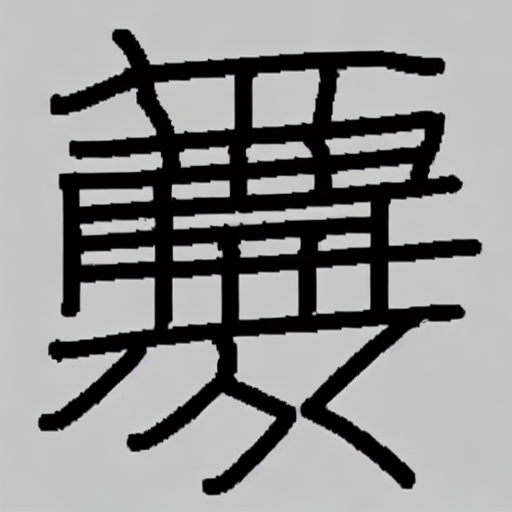

In [15]:
prompt = "a kanji meaning water"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

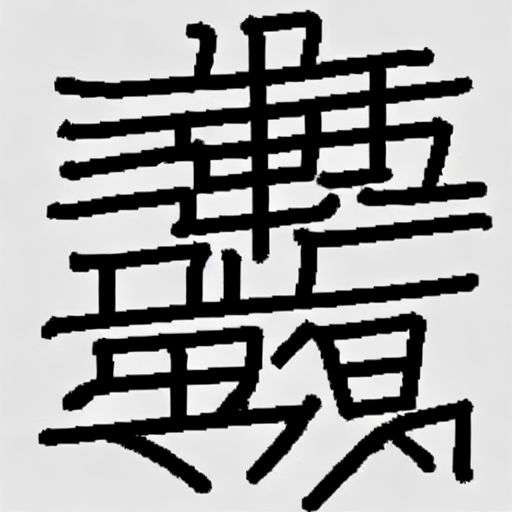

In [17]:
prompt = "a kanji meaning fire"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

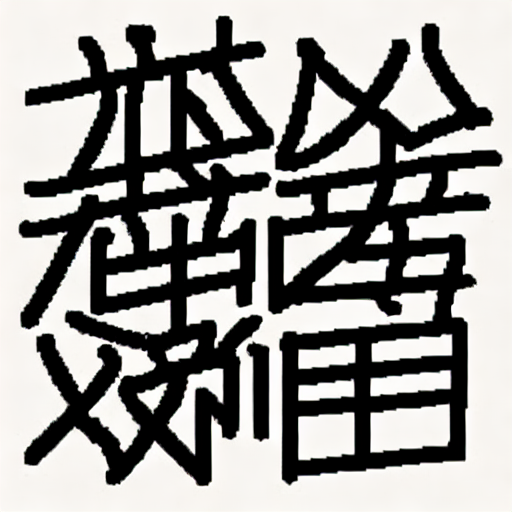

In [22]:
prompt = "a kanji meaning wood"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

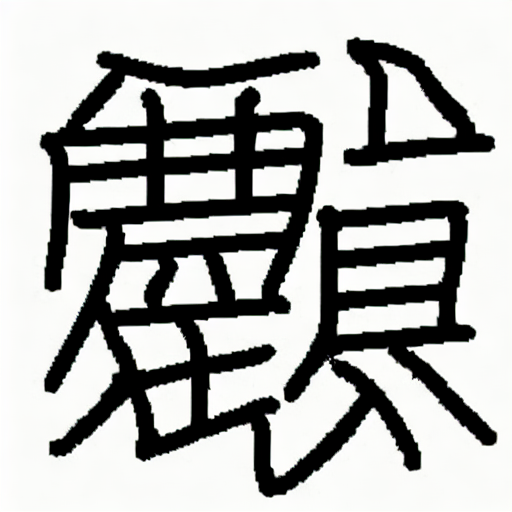

In [25]:
prompt = "a kanji meaning gold"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

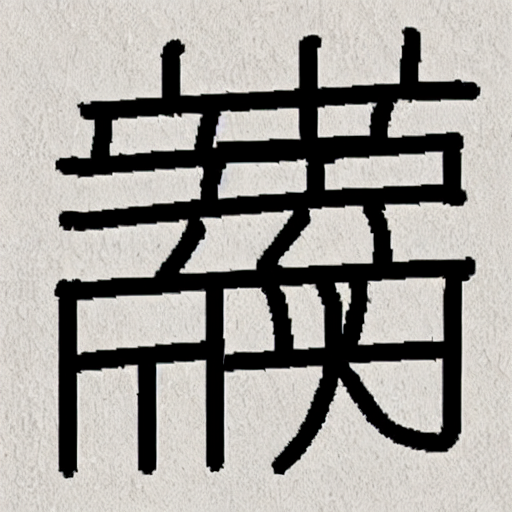

In [26]:
prompt = "a kanji meaning soil"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

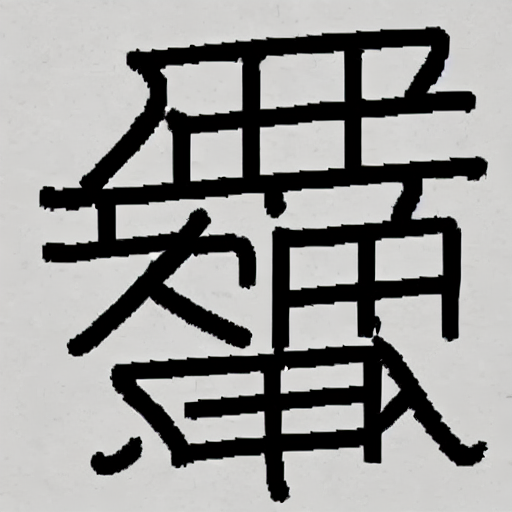

In [29]:
prompt = "a kanji meaning linux"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

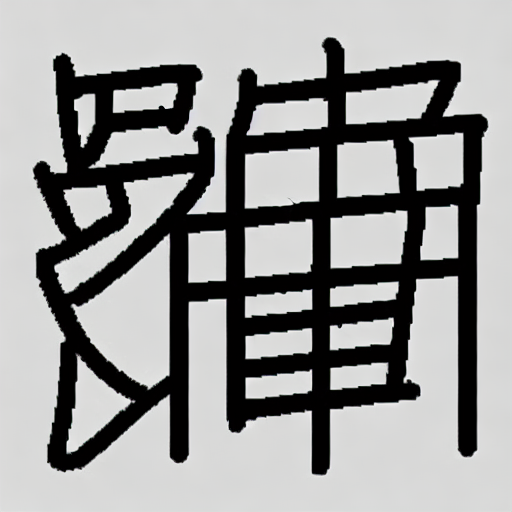

In [34]:
prompt = "a kanji meaning YouTube"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

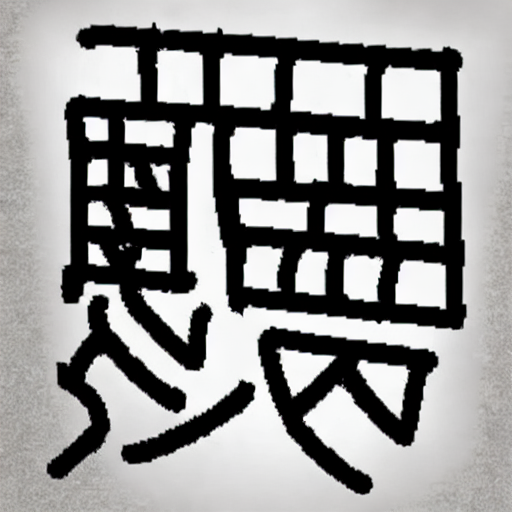

In [31]:
prompt = "a kanji meaning Deep Learning"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

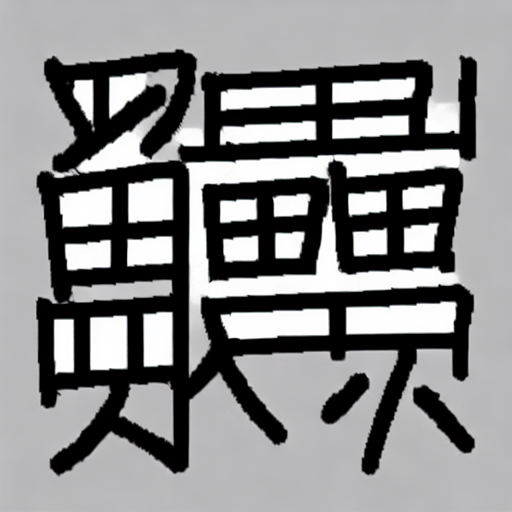

In [33]:
prompt = "a kanji meaning Gundam"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

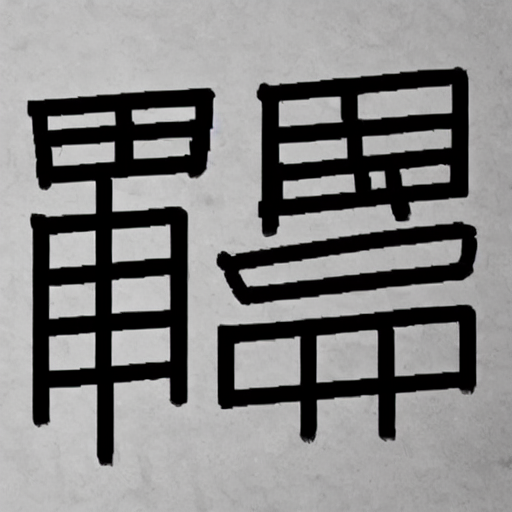

In [38]:
prompt = "a kanji meaning Elon Musk"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

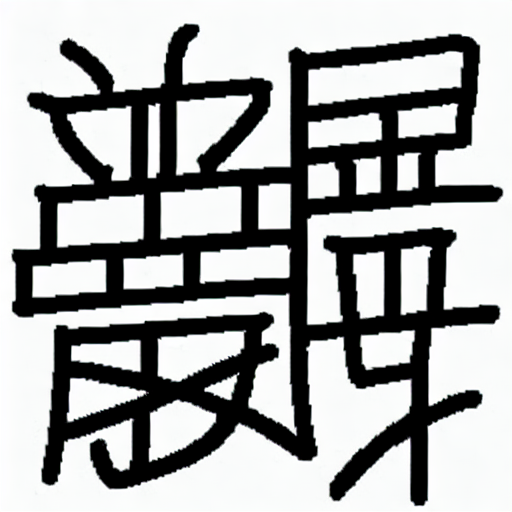

In [40]:
prompt = "a kanji meaning rainbow"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

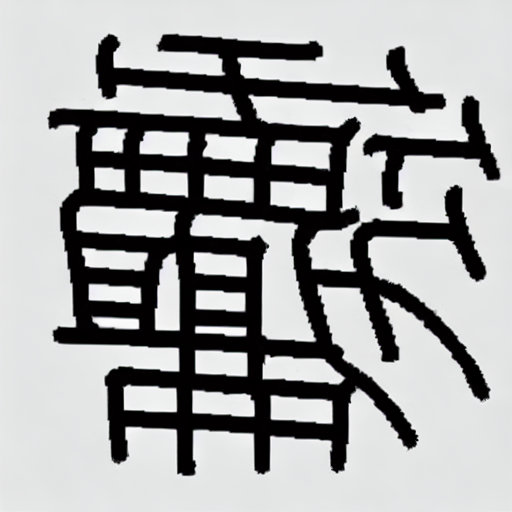

In [42]:
prompt = "a kanji meaning fish"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

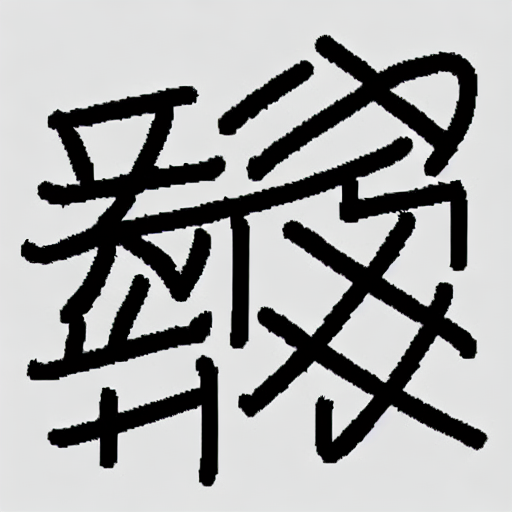

In [43]:
prompt = "a kanji meaning nature"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

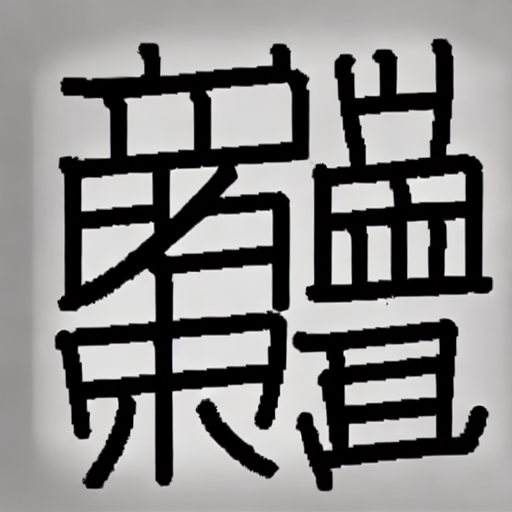

In [44]:
prompt = "a kanji meaning Harry Potter"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

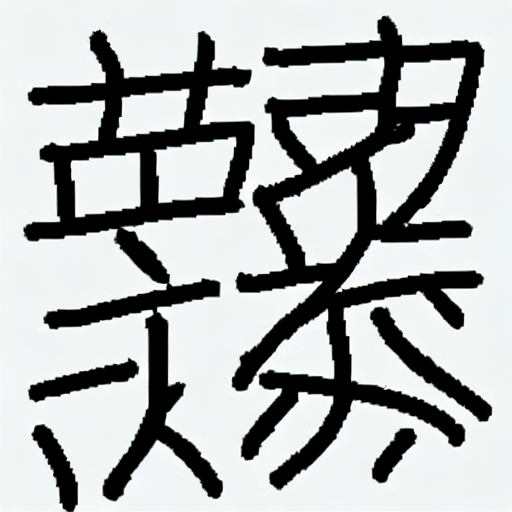

In [46]:
prompt = "a kanji meaning grandfather"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

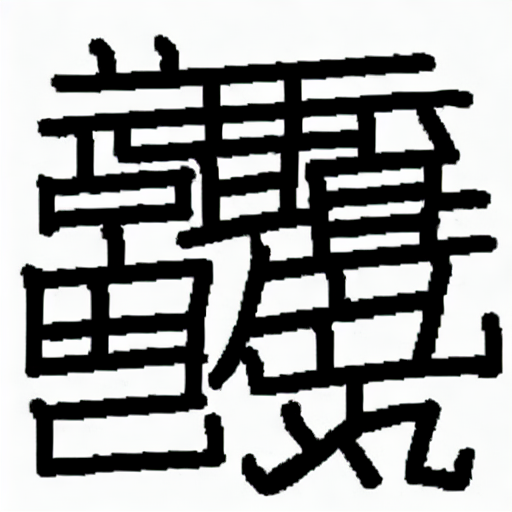

In [47]:
prompt = "a kanji meaning mother"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

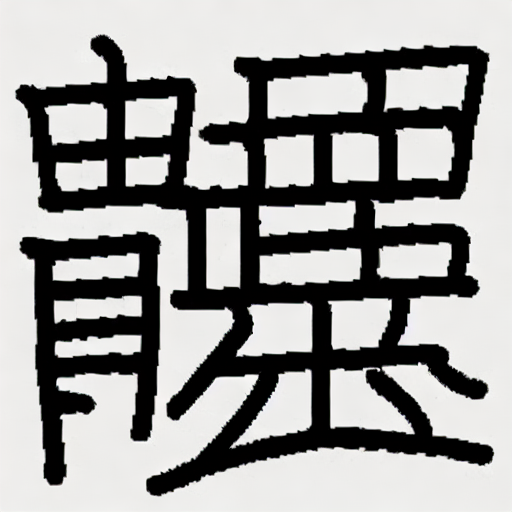

In [49]:
prompt = "a kanji meaning father"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

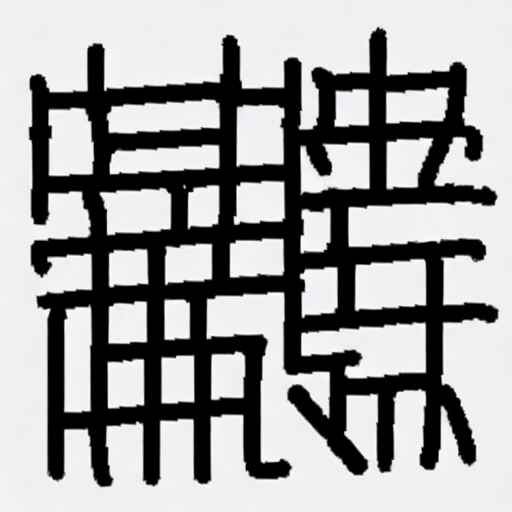

In [50]:
prompt = "a kanji meaning Kathak"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

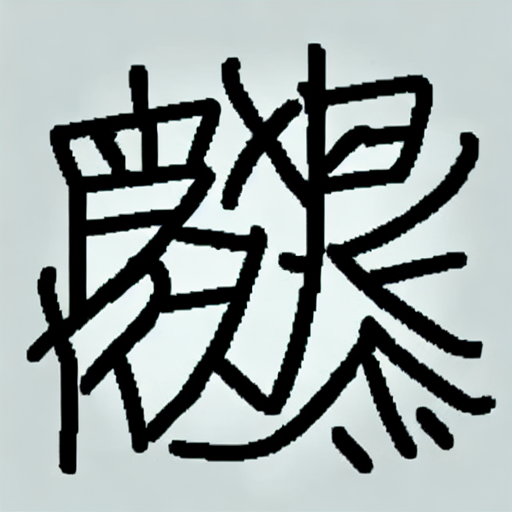

In [52]:
prompt = "a kanji meaning Satyajit Ray"  # Replace with desired prompt
create_kanji(prompt, num_images=1)

  0%|          | 0/50 [00:00<?, ?it/s]

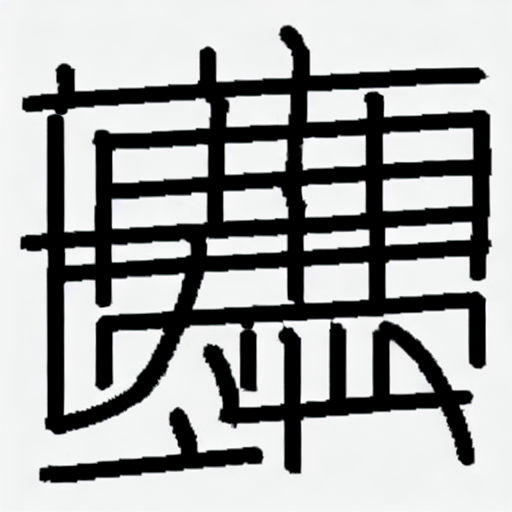

In [54]:
prompt = "a kanji meaning Netaji Subhash Chandra Bose"  # Replace with desired prompt
create_kanji(prompt, num_images=1)